In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
import pandas as pd

'''load EEG dataset'''

EEG_df = pd.read_csv("EEG_data.csv")
EEG_df

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12806,9.0,9.0,64.0,38.0,-39.0,127574.0,9951.0,709.0,21732.0,3872.0,39728.0,2598.0,960.0,1.0,0.0
12807,9.0,9.0,61.0,35.0,-275.0,323061.0,797464.0,153171.0,145805.0,39829.0,571280.0,36574.0,10010.0,1.0,0.0
12808,9.0,9.0,60.0,29.0,-426.0,680989.0,154296.0,40068.0,39122.0,10966.0,26975.0,20427.0,2024.0,1.0,0.0
12809,9.0,9.0,60.0,29.0,-84.0,366269.0,27346.0,11444.0,9932.0,1939.0,3283.0,12323.0,1764.0,1.0,0.0


In [5]:
'''load demographic dataset'''

dem_df = pd.read_csv("demo.csv")
dem_df

,subject ID,age,ethnicity,gender
0,0,5,Han Chinese,M
1,1,6,Han Chinese,M
2,2,7,English,M
3,3,8,Han Chinese,F
4,4,7,Bengali,M
5,5,6,Han Chinese,M
6,6,8,Han Chinese,M
7,7,7,Han Chinese,M
8,8,5,Han Chinese,M
9,9,9,Han Chinese,F


In [6]:
EEG_df.rename(columns={'user-definedlabeln': 'userdefinedlabel'}, inplace=True)
EEG_columns = EEG_df.columns  # Accessing column names
print(EEG_columns)


Index(['SubjectID', 'VideoID', 'Attention', 'Mediation', 'Raw', 'Delta',
       'Theta', 'Alpha1', 'Alpha2', 'Beta1', 'Beta2', 'Gamma1', 'Gamma2',
       'predefinedlabel', 'userdefinedlabel'],
      dtype='object')


In [7]:
dem_df.rename(columns={'subject ID': 'SubjectID'}, inplace=True)
dem_columns = dem_df.columns  # Accessing column names
print(dem_columns)

Index(['SubjectID', ' age', ' ethnicity', ' gender'], dtype='object')


In [8]:
EEG_df['Sample'] = EEG_df.reset_index().index +0.5

In [9]:
merge_df = EEG_df.merge(dem_df, on = 'SubjectID')
merge_df.columns = merge_df.columns.str.strip()
merge_df

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,userdefinedlabel,Sample,age,ethnicity,gender
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0,0.5,5,Han Chinese,M
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0,1.5,5,Han Chinese,M
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0,2.5,5,Han Chinese,M
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0,3.5,5,Han Chinese,M
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0,4.5,5,Han Chinese,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12806,9.0,9.0,64.0,38.0,-39.0,127574.0,9951.0,709.0,21732.0,3872.0,39728.0,2598.0,960.0,1.0,0.0,12806.5,9,Han Chinese,F
12807,9.0,9.0,61.0,35.0,-275.0,323061.0,797464.0,153171.0,145805.0,39829.0,571280.0,36574.0,10010.0,1.0,0.0,12807.5,9,Han Chinese,F
12808,9.0,9.0,60.0,29.0,-426.0,680989.0,154296.0,40068.0,39122.0,10966.0,26975.0,20427.0,2024.0,1.0,0.0,12808.5,9,Han Chinese,F
12809,9.0,9.0,60.0,29.0,-84.0,366269.0,27346.0,11444.0,9932.0,1939.0,3283.0,12323.0,1764.0,1.0,0.0,12809.5,9,Han Chinese,F


In [10]:
merge_df.shape

(12811, 19)

In [11]:
pd.crosstab(merge_df.VideoID, merge_df.userdefinedlabel)

userdefinedlabel,0.0,1.0
VideoID,,
0.0,988,424
1.0,566,848
2.0,746,528
3.0,498,708
4.0,376,980
5.0,492,738
6.0,596,585
7.0,694,483
8.0,262,1018


In [12]:
s_v_u = merge_df.groupby(['SubjectID', 'VideoID'])['userdefinedlabel'].first().reset_index()
s_v_u

,SubjectID,VideoID,userdefinedlabel
0,0.0,0.0,0.0
1,0.0,1.0,1.0
2,0.0,2.0,1.0
3,0.0,3.0,0.0
4,0.0,4.0,0.0
...,...,...,...
95,9.0,5.0,1.0
96,9.0,6.0,0.0
97,9.0,7.0,0.0
98,9.0,8.0,1.0


In [13]:
data = s_v_u.pivot(index = 'SubjectID',  columns = 'VideoID', values = 'userdefinedlabel')
data


VideoID,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0
SubjectID,,,,,,,,,,
0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
3.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0
4.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0
5.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0
6.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
7.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0
8.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0


In [14]:
merge_df['gender'] = merge_df['gender'].replace({'M':1, 'F':0})
merge_df['ethnicity']=merge_df['ethnicity'].replace({'Han Chinese':0,'Bengali':1,'English':2})

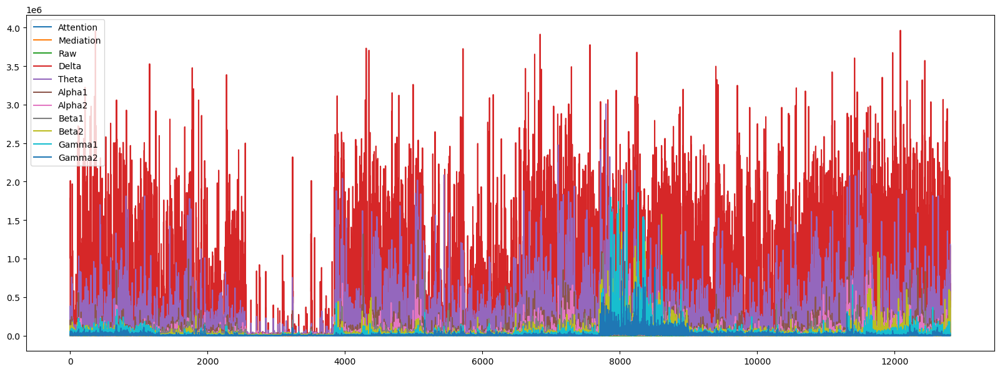

In [15]:
continuous_features = ['Attention', 'Mediation', 'Raw', 'Delta', 'Theta', 'Alpha1', 'Alpha2', 'Beta1', 'Beta2', 'Gamma1', 'Gamma2']

merge_df[continuous_features].plot(figsize = (20, 7))
plt.show()

In [16]:
merge_df = merge_df.drop(range(4244, 4388))
merge_df = merge_df.drop(range(7717, 8992))
merge_df = merge_df.drop(labels = [664, 665, 12214, 12215], axis = 0)
merge_df.shape

(11388, 19)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


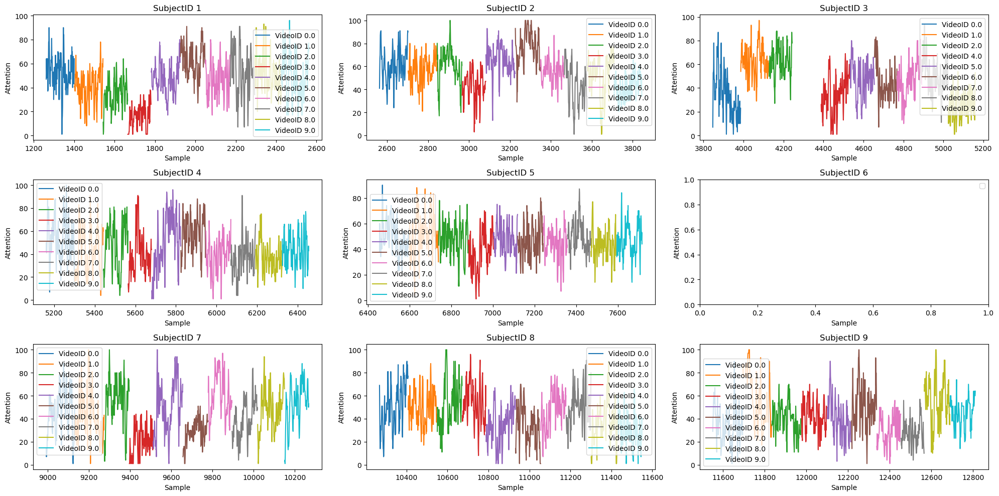

In [17]:
filtered_df = merge_df[merge_df['SubjectID'].between(0, 10)]

# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 10))

# Iterate over subjects and plot each VideoID subplot for Attention
for i, ax in enumerate(axes.flatten()):
    subject_data = filtered_df[filtered_df['SubjectID'] == i+1]
    for video_id, group_data in subject_data.groupby('VideoID'):
        ax.plot(group_data['Sample'], group_data['Attention'], label=f'VideoID {video_id}')
    ax.set_xlabel('Sample')
    ax.set_ylabel('Attention')
    ax.set_title(f'SubjectID {i+1}')
    ax.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


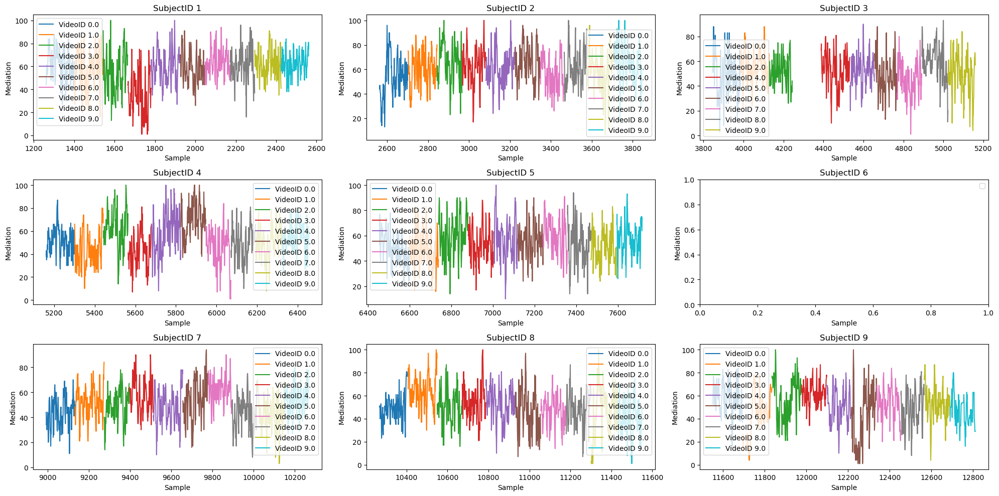

In [18]:
filtered_df = merge_df[merge_df['SubjectID'].between(0, 10)]

# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 10))

# Iterate over subjects and plot each VideoID subplot for Attention
for i, ax in enumerate(axes.flatten()):
    subject_data = filtered_df[filtered_df['SubjectID'] == i+1]
    for video_id, group_data in subject_data.groupby('VideoID'):
        ax.plot(group_data['Sample'], group_data['Mediation'], label=f'VideoID {video_id}')
    ax.set_xlabel('Sample')
    ax.set_ylabel('Mediation')
    ax.set_title(f'SubjectID {i+1}')
    ax.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


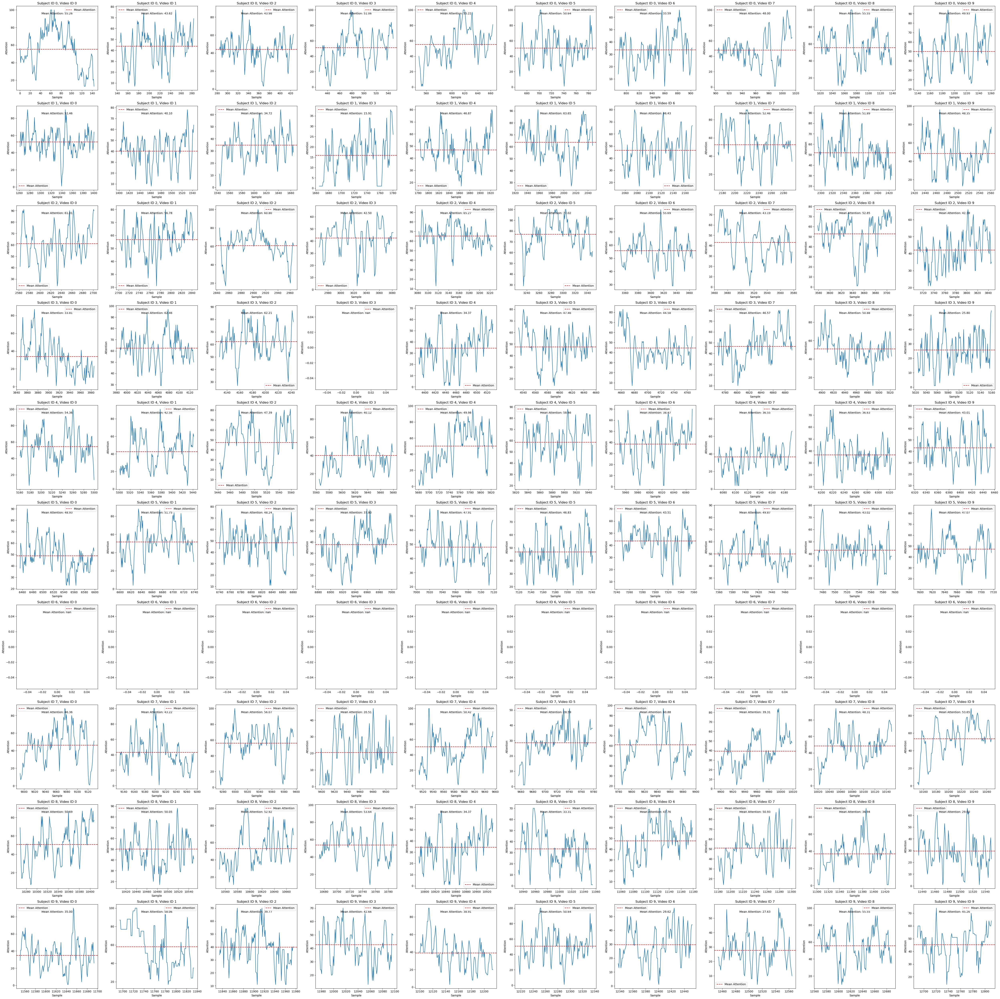

In [19]:
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(50, 50))

# Iterate through subject IDs and video IDs to plot each subplot
for i, ax_row in enumerate(axes):
    for j, ax in enumerate(ax_row):
        subject_id = i + 0  # Calculate subject ID based on subplot row
        video_id = j + 0 # Calculate video ID based on subplot column
        subset_df = merge_df[(merge_df['SubjectID'] == subject_id) & (merge_df['VideoID'] == video_id)]
        sns.lineplot(data=subset_df, x='Sample', y='Attention', ax=ax)
        ax.set_title(f'Subject ID {subject_id}, Video ID {video_id}')
        ax.set_xlabel('Sample')
        ax.set_ylabel('Attention')
        # Calculate and display the mean of Theta on the plot
        mean_att = subset_df['Attention'].mean()
        ax.axhline(mean_att, color='red', linestyle='--', label='Mean Attention')
        ax.legend()
        ax.text(0.5, 0.9, f'Mean Attention: {mean_att:.2f}', transform=ax.transAxes, ha='center')
# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
#plt.show()

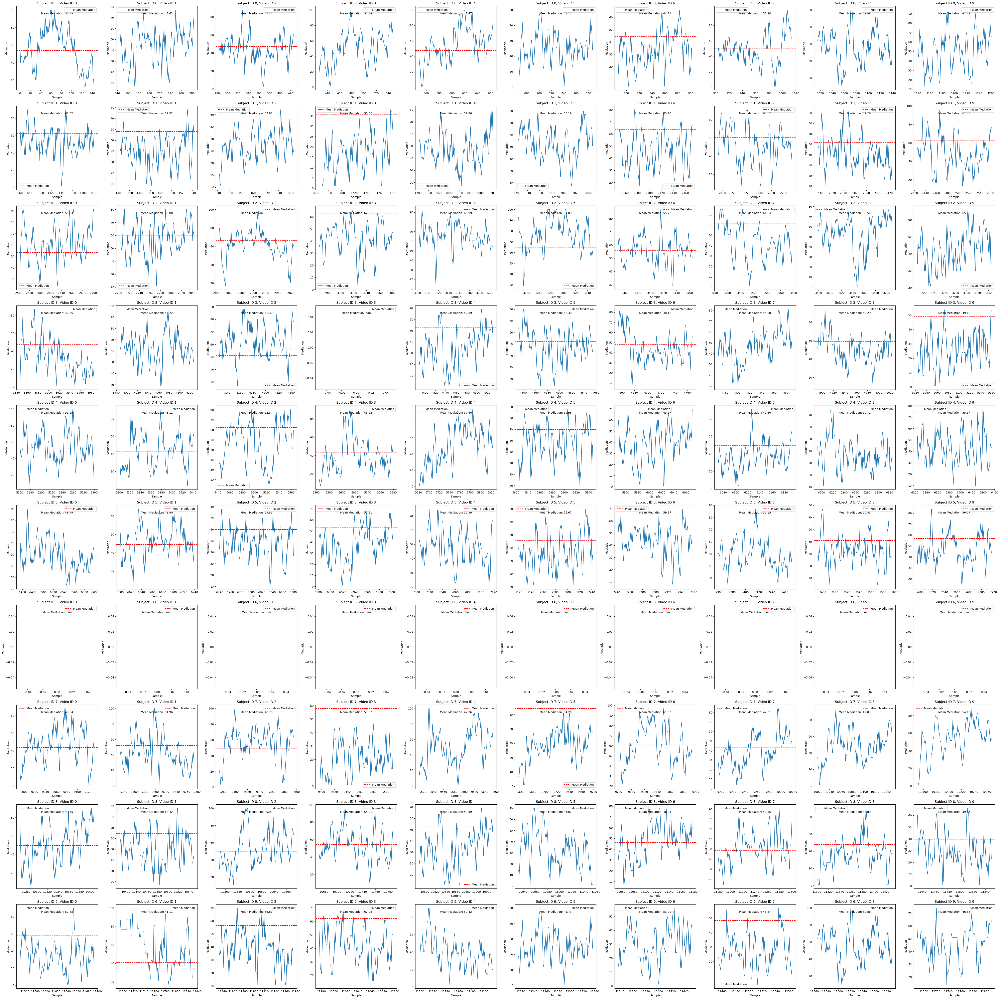

In [20]:
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(50, 50))

# Iterate through subject IDs and video IDs to plot each subplot
for i, ax_row in enumerate(axes):
    for j, ax in enumerate(ax_row):
        subject_id = i + 0  # Calculate subject ID based on subplot row
        video_id = j + 0 # Calculate video ID based on subplot column
        subset_df = merge_df[(merge_df['SubjectID'] == subject_id) & (merge_df['VideoID'] == video_id)]
        sns.lineplot(data=subset_df, x='Sample', y='Attention', ax=ax)
        ax.set_title(f'Subject ID {subject_id}, Video ID {video_id}')
        ax.set_xlabel('Sample')
        ax.set_ylabel('Mediation')
        # Calculate and display the mean of Theta on the plot
        mean_media = subset_df['Mediation'].mean()
        ax.axhline(mean_media, color='red', linestyle='--', label='Mean Mediation')
        ax.legend()
        ax.text(0.5, 0.9, f'Mean Mediation: {mean_media:.2f}', transform=ax.transAxes, ha='center')
# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
#plt.show()

In [21]:
mean_att_list = []
for subject_id in merge_df['SubjectID'].unique():
    subset_df = merge_df[merge_df['SubjectID'] == subject_id]
    mean_att = subset_df['Attention'].mean()
    mean_att_list.append((subject_id, mean_att))

# Sort the mean_theta_list in descending order based on the mean Theta values
mean_att_list.sort(key=lambda x: x[1], reverse=True)

# Print the list of mean Theta values for each subject in descending order
for subject_id, mean_att in mean_att_list:
    print(f"Subject ID {subject_id}: Mean Attention = {mean_att:.2f}")

Subject ID 2.0: Mean Attention = 55.97
Subject ID 0.0: Mean Attention = 48.71
Subject ID 5.0: Mean Attention = 46.62
Subject ID 1.0: Mean Attention = 45.56
Subject ID 3.0: Mean Attention = 44.97
Subject ID 4.0: Mean Attention = 44.90
Subject ID 7.0: Mean Attention = 44.84
Subject ID 8.0: Mean Attention = 43.99
Subject ID 9.0: Mean Attention = 42.58


In [22]:
mean_media_list = []
for subject_id in merge_df['SubjectID'].unique():
    subset_df = merge_df[merge_df['SubjectID'] == subject_id]
    mean_media = subset_df['Attention'].mean()
    mean_media_list.append((subject_id, mean_media))

# Sort the mean_theta_list in descending order based on the mean Theta values
mean_media_list.sort(key=lambda x: x[1], reverse=True)

# Print the list of mean Theta values for each subject in descending order
for subject_id, mean_media in mean_media_list:
    print(f"Subject ID {subject_id}: Mean Mediation = {mean_media:.2f}")

Subject ID 2.0: Mean Mediation = 55.97
Subject ID 0.0: Mean Mediation = 48.71
Subject ID 5.0: Mean Mediation = 46.62
Subject ID 1.0: Mean Mediation = 45.56
Subject ID 3.0: Mean Mediation = 44.97
Subject ID 4.0: Mean Mediation = 44.90
Subject ID 7.0: Mean Mediation = 44.84
Subject ID 8.0: Mean Mediation = 43.99
Subject ID 9.0: Mean Mediation = 42.58


In [23]:
mean_values = []

# Iterate through subject IDs and video IDs
for subject_id in range(10):
    for video_id in range(10):
        subset_df = merge_df[(merge_df['SubjectID'] == subject_id) & (merge_df['VideoID'] == video_id)]
        mean_att1 = subset_df['Attention'].mean()
        mean_values.append((subject_id, video_id, mean_att1))

# Create a dictionary to map subject ID and video ID to mean theta values
mean_att1_dict = {(subject_id, video_id): mean_att1 for subject_id, video_id, mean_att1 in mean_values}

# Add the mean values as a new column in the original DataFrame
merge_df['MeanAttention'] = [mean_att1_dict.get((subject_id, video_id), None) for subject_id, video_id in zip(merge_df['SubjectID'], merge_df['VideoID'])]

# Print the updated DataFrame with the new MeanTheta column
merge_df

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,userdefinedlabel,Sample,age,ethnicity,gender,MeanAttention
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0,0.5,5,0,1,55.256944
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0,1.5,5,0,1,55.256944
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0,2.5,5,0,1,55.256944
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0,3.5,5,0,1,55.256944
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0,4.5,5,0,1,55.256944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12806,9.0,9.0,64.0,38.0,-39.0,127574.0,9951.0,709.0,21732.0,3872.0,39728.0,2598.0,960.0,1.0,0.0,12806.5,9,0,0,45.262295
12807,9.0,9.0,61.0,35.0,-275.0,323061.0,797464.0,153171.0,145805.0,39829.0,571280.0,36574.0,10010.0,1.0,0.0,12807.5,9,0,0,45.262295
12808,9.0,9.0,60.0,29.0,-426.0,680989.0,154296.0,40068.0,39122.0,10966.0,26975.0,20427.0,2024.0,1.0,0.0,12808.5,9,0,0,45.262295
12809,9.0,9.0,60.0,29.0,-84.0,366269.0,27346.0,11444.0,9932.0,1939.0,3283.0,12323.0,1764.0,1.0,0.0,12809.5,9,0,0,45.262295


In [24]:
min_value = merge_df['MeanAttention'].min()
max_value = merge_df['MeanAttention'].max()
merge_df['ConfusionScore'] = (merge_df['MeanAttention'] - min_value) / (max_value - min_value)

In [25]:
merge_df

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,...,Gamma1,Gamma2,predefinedlabel,userdefinedlabel,Sample,age,ethnicity,gender,MeanAttention,ConfusionScore
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,...,33228.0,8293.0,0.0,0.0,0.5,5,0,1,55.256944,0.643853
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,...,5293.0,2740.0,0.0,0.0,1.5,5,0,1,55.256944,0.643853
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,...,57243.0,25354.0,0.0,0.0,2.5,5,0,1,55.256944,0.643853
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,...,49960.0,33932.0,0.0,0.0,3.5,5,0,1,55.256944,0.643853
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,...,44790.0,29749.0,0.0,0.0,4.5,5,0,1,55.256944,0.643853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12806,9.0,9.0,64.0,38.0,-39.0,127574.0,9951.0,709.0,21732.0,3872.0,...,2598.0,960.0,1.0,0.0,12806.5,9,0,0,45.262295,0.480326
12807,9.0,9.0,61.0,35.0,-275.0,323061.0,797464.0,153171.0,145805.0,39829.0,...,36574.0,10010.0,1.0,0.0,12807.5,9,0,0,45.262295,0.480326
12808,9.0,9.0,60.0,29.0,-426.0,680989.0,154296.0,40068.0,39122.0,10966.0,...,20427.0,2024.0,1.0,0.0,12808.5,9,0,0,45.262295,0.480326
12809,9.0,9.0,60.0,29.0,-84.0,366269.0,27346.0,11444.0,9932.0,1939.0,...,12323.0,1764.0,1.0,0.0,12809.5,9,0,0,45.262295,0.480326


In [26]:
merge_df['Conf_score'] = merge_df['ConfusionScore'].round(0)

In [27]:
print(merge_df['Conf_score'].min())
print(merge_df['Conf_score'].max())

0.0
1.0


In [28]:
merge_df = merge_df.drop('ConfusionScore', axis=1)

<function matplotlib.pyplot.show(close=None, block=None)>

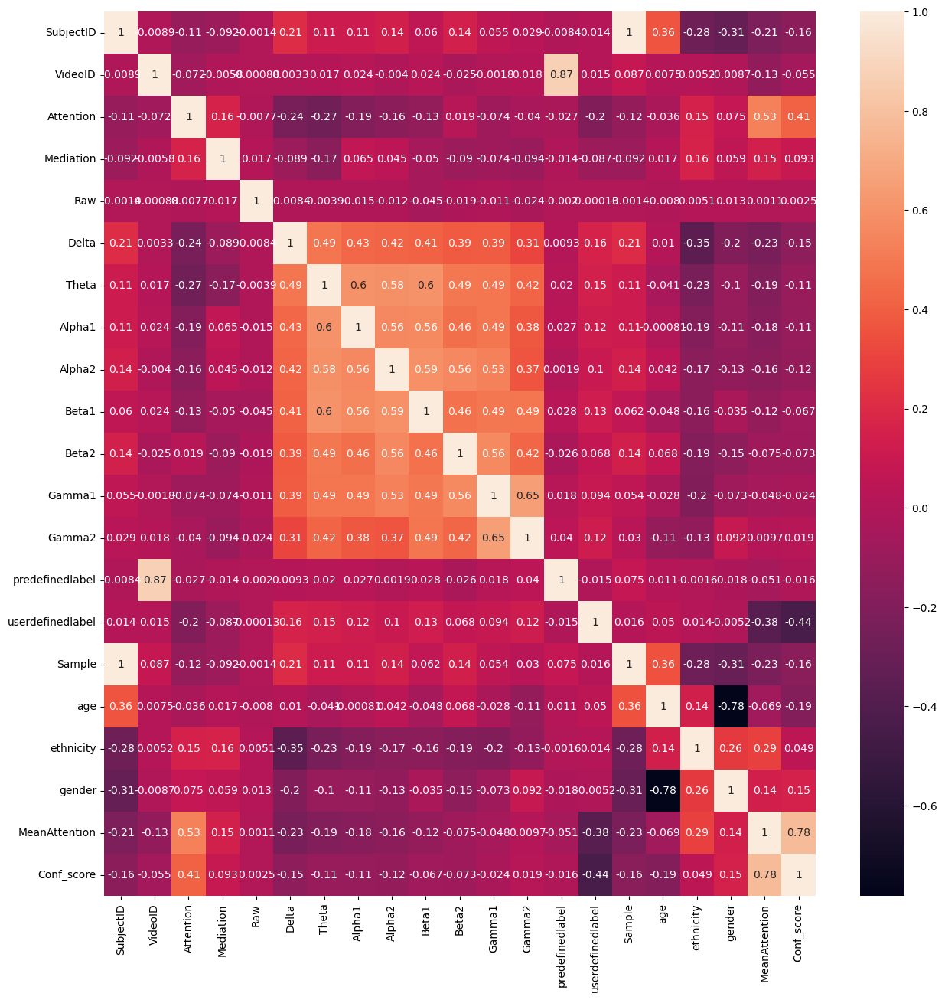

In [29]:

plt.figure(figsize = (15,15))
corr_matrix = merge_df.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show

In [30]:
merge_df

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,...,Gamma1,Gamma2,predefinedlabel,userdefinedlabel,Sample,age,ethnicity,gender,MeanAttention,Conf_score
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,...,33228.0,8293.0,0.0,0.0,0.5,5,0,1,55.256944,1.0
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,...,5293.0,2740.0,0.0,0.0,1.5,5,0,1,55.256944,1.0
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,...,57243.0,25354.0,0.0,0.0,2.5,5,0,1,55.256944,1.0
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,...,49960.0,33932.0,0.0,0.0,3.5,5,0,1,55.256944,1.0
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,...,44790.0,29749.0,0.0,0.0,4.5,5,0,1,55.256944,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12806,9.0,9.0,64.0,38.0,-39.0,127574.0,9951.0,709.0,21732.0,3872.0,...,2598.0,960.0,1.0,0.0,12806.5,9,0,0,45.262295,0.0
12807,9.0,9.0,61.0,35.0,-275.0,323061.0,797464.0,153171.0,145805.0,39829.0,...,36574.0,10010.0,1.0,0.0,12807.5,9,0,0,45.262295,0.0
12808,9.0,9.0,60.0,29.0,-426.0,680989.0,154296.0,40068.0,39122.0,10966.0,...,20427.0,2024.0,1.0,0.0,12808.5,9,0,0,45.262295,0.0
12809,9.0,9.0,60.0,29.0,-84.0,366269.0,27346.0,11444.0,9932.0,1939.0,...,12323.0,1764.0,1.0,0.0,12809.5,9,0,0,45.262295,0.0


In [31]:
from statsmodels.stats.weightstats import ztest

# categorical_variable
dyslexic_state     = merge_df[merge_df['predefinedlabel'] == 1]
not_dyslexic_state = merge_df[merge_df['predefinedlabel'] == 0]

# numerical_variable
continuous_features = ['Attention', 'Mediation', 'Raw', 'Delta','Theta', 'Alpha1', 'Alpha2', 'Beta1', 'Beta2', 'Gamma1', 'Gamma2','MeanAttention']

for column in continuous_features :
    
    # z-test
    z_value, p_value = ztest(dyslexic_state[column], not_dyslexic_state[column])
    
    print('\nIs there a difference in', '"', column, '"', 'feature between confused and non confused state of a student ?')
    print('\nz-test value : %f'%float("{:.6f}".format(z_value)))
    print('p-value : %f'%p_value)
    print()

    # Significance level = 0.05
    alpha = 0.05

    if p_value <= alpha:
    
        print('Conclusion :',)
        print('Since p-value = (%f)'%p_value,'<','alpha = (%.2f)'%alpha,'''We conclude that there is a difference between two groups.
So, we reject the null hypothesis H0. i.e., μ1 != μ2 at %.2f level of significance.'''%alpha)
        print('"', column,'"', 'feature is very useful in distinguishing confused and not confused state of a student.')
        
        print('='*115)

    else:
    
        print('Conclusion :',)
        print('Since p-value = (%f)'%p_value,'>','alpha = (%.2f)'%alpha,'''We conclude that there is no difference between two groups.
So, we failed to reject the null hypothesis H0. i.e., μ1 = μ2 at %.2f level of significance.'''%alpha)
        print('"', column, '"', 'feature is not very useful in distinguishing confused and not confused state of a student.')
        
        print('='*115)


Is there a difference in " Attention " feature between confused and non confused state of a student ?

z-test value : -2.883649
p-value : 0.003931

Conclusion :
Since p-value = (0.003931) < alpha = (0.05) We conclude that there is a difference between two groups.
So, we reject the null hypothesis H0. i.e., μ1 != μ2 at 0.05 level of significance.
" Attention " feature is very useful in distinguishing confused and not confused state of a student.

Is there a difference in " Mediation " feature between confused and non confused state of a student ?

z-test value : -1.528766
p-value : 0.126322

Conclusion :
Since p-value = (0.126322) > alpha = (0.05) We conclude that there is no difference between two groups.
So, we failed to reject the null hypothesis H0. i.e., μ1 = μ2 at 0.05 level of significance.
" Mediation " feature is not very useful in distinguishing confused and not confused state of a student.

Is there a difference in " Raw " feature between confused and non confused state of a

In [32]:
z_test_value_dict = {}
p_value_dict      = {}

for column in continuous_features:

    z_test_value, p_value = ztest(dyslexic_state[column], not_dyslexic_state[column])
    
    z_test_value_dict[column] = z_test_value
    p_value_dict[column]      = p_value 

print('''Numerical_features which are very useful in distinguishing the confused and non confused state of a student :\n''')
for key, value in p_value_dict.items():
    if value <= 0.05:
        print(key)


Numerical_features which are very useful in distinguishing the confused and non confused state of a student :

Attention
Theta
Alpha1
Beta1
Beta2
Gamma2
MeanAttention


In [33]:
merge_df

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,...,Gamma1,Gamma2,predefinedlabel,userdefinedlabel,Sample,age,ethnicity,gender,MeanAttention,Conf_score
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,...,33228.0,8293.0,0.0,0.0,0.5,5,0,1,55.256944,1.0
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,...,5293.0,2740.0,0.0,0.0,1.5,5,0,1,55.256944,1.0
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,...,57243.0,25354.0,0.0,0.0,2.5,5,0,1,55.256944,1.0
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,...,49960.0,33932.0,0.0,0.0,3.5,5,0,1,55.256944,1.0
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,...,44790.0,29749.0,0.0,0.0,4.5,5,0,1,55.256944,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12806,9.0,9.0,64.0,38.0,-39.0,127574.0,9951.0,709.0,21732.0,3872.0,...,2598.0,960.0,1.0,0.0,12806.5,9,0,0,45.262295,0.0
12807,9.0,9.0,61.0,35.0,-275.0,323061.0,797464.0,153171.0,145805.0,39829.0,...,36574.0,10010.0,1.0,0.0,12807.5,9,0,0,45.262295,0.0
12808,9.0,9.0,60.0,29.0,-426.0,680989.0,154296.0,40068.0,39122.0,10966.0,...,20427.0,2024.0,1.0,0.0,12808.5,9,0,0,45.262295,0.0
12809,9.0,9.0,60.0,29.0,-84.0,366269.0,27346.0,11444.0,9932.0,1939.0,...,12323.0,1764.0,1.0,0.0,12809.5,9,0,0,45.262295,0.0


In [34]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import callbacks,layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Conv1D, MaxPooling1D


In [35]:
columns_to_keep = ['MeanAttention','Delta', 'Attention']
# Drop all columns except the specified ones
X = merge_df.drop(merge_df.columns.difference(columns_to_keep), axis=1)
y = merge_df['Conf_score']

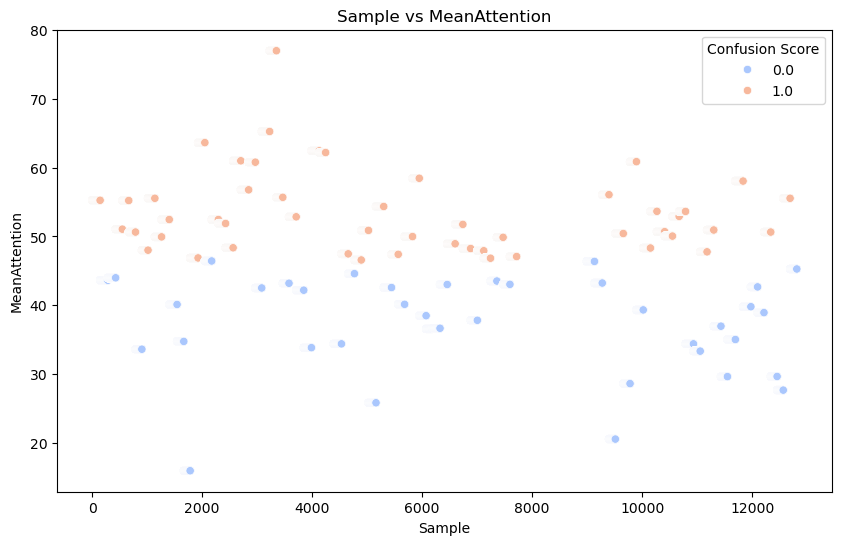

In [36]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merge_df, x='Sample', y='MeanAttention', hue='Conf_score',  palette='coolwarm')

plt.title('Sample vs MeanAttention')
plt.xlabel('Sample')
plt.ylabel('MeanAttention')
plt.legend(title='Confusion Score')
plt.show()

In [37]:
merge_df.columns

Index(['SubjectID', 'VideoID', 'Attention', 'Mediation', 'Raw', 'Delta',
       'Theta', 'Alpha1', 'Alpha2', 'Beta1', 'Beta2', 'Gamma1', 'Gamma2',
       'predefinedlabel', 'userdefinedlabel', 'Sample', 'age', 'ethnicity',
       'gender', 'MeanAttention', 'Conf_score'],
      dtype='object')

merge_df

In [38]:
X

,Attention,Delta,MeanAttention
0,56.0,301963.0,55.256944
1,40.0,73787.0,55.256944
2,47.0,758353.0,55.256944
3,47.0,2012240.0,55.256944
4,44.0,1005145.0,55.256944
...,...,...,...
12806,64.0,127574.0,45.262295
12807,61.0,323061.0,45.262295
12808,60.0,680989.0,45.262295
12809,60.0,366269.0,45.262295


In [39]:
y

0        1.0
1        1.0
2        1.0
3        1.0
4        1.0
        ... 
12806    0.0
12807    0.0
12808    0.0
12809    0.0
12810    0.0
Name: Conf_score, Length: 11388, dtype: float64

In [40]:
print(X.shape)
print(y.shape)
class_counts = pd.value_counts(y)
print(class_counts)

(11388, 3)
(11388,)
Conf_score
1.0    6423
0.0    4965
Name: count, dtype: int64


In [41]:
X_train, X_test, y_train, y_test = train_test_split(StandardScaler().fit_transform(X), y, test_size=0.5, random_state=42)

# Sample the data
oversampler = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train, y_train)

# *******************Shape Before Sampling**************************
print(X_train.shape)
print(y_train.shape)
# ******************Shape After Sampling****************************
print(X_train_resampled.shape)
print(y_train_resampled.shape)

(5694, 3)
(5694,)
(6418, 3)
(6418,)


In [42]:
X_train

array([[ 1.96930518, -0.2811393 ,  1.57926831],
       [-1.70440847, -0.45745742, -1.30118154],
       [-0.91718412, -0.75437943,  0.86445177],
       ...,
       [ 0.34237485, -0.5642808 ,  0.09063184],
       [-0.12995976,  0.70732034, -1.27378266],
       [ 1.96930518, -0.51912797,  0.33509118]])

In [43]:
import pandas as pd

# Assuming X_train_resampled and X are defined
X_train_resampled_df = pd.DataFrame(X_train_resampled, columns=X.columns)  # Replace X.columns with your column names
y_train_resampled_df = pd.Series(y_train_resampled, name='Conf_score')
X_test_df = pd.DataFrame(X_test, columns=X.columns)
y_test_df = pd.Series(y_test, name='Conf_score')
subject_id_train = merge_df.loc[y_train.index, 'SubjectID'].reset_index(drop=True)  # Assuming merge_df has the original indices

X_train_resampled_df['SubjectID'] = subject_id_train  # Add 'SubjectID' to the training data

# Concatenate 'SubjectID' from merge_df to X_test
X_test_df = pd.DataFrame(X_test, columns=X.columns)  # Replace X.columns with your column names
subject_id_test = merge_df.loc[y_test.index, 'SubjectID'].reset_index(drop=True)  # Assuming merge_df has the original indices

X_test_df['SubjectID'] = subject_id_test 

# Save as CSV files
X_train_resampled_df.to_csv('X_train_resampled.csv', index=False)
y_train_resampled_df.to_csv('y_train_resampled.csv', index=False)
X_test_df.to_csv('X_test.csv', index=False)
y_test_df.to_csv('y_test.csv', index=False)


Test Accuracy: 0.9951
Precision: 1.0
Recall: 0.9912881144990666
F1 Score: 0.995625


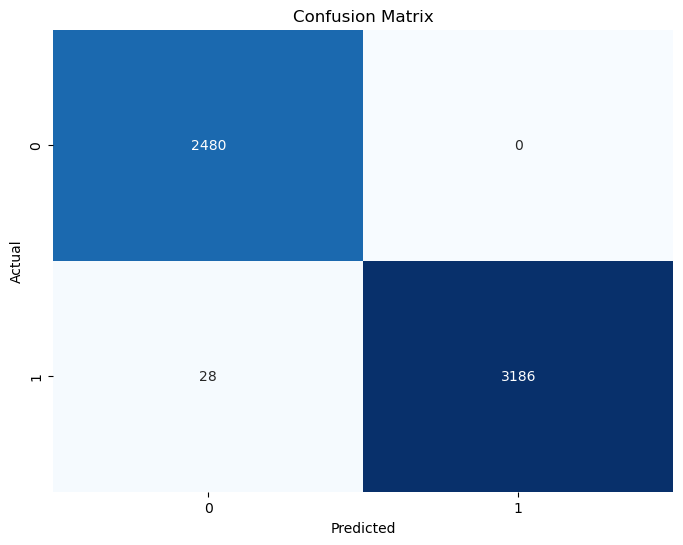

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Create an SVM model
svm_model = SVC(kernel='linear', C=10, shrinking =True)

# Train the SVM model
svm_model.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred = svm_model.predict(X_test)

# Evaluate model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")
print('Precision:', precision)
print('Recall:', recall)
print('F1 Score:', f1)

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [45]:
import pandas as pd

# Load your new data from the CSV file
new_data = pd.read_csv('X_test.csv')

# Display unique Subject IDs to the user for selection
unique_subject_ids = new_data['SubjectID'].unique()
#print("Available Subject IDs:")
print(unique_subject_ids)

# Prompt the user to enter a Subject ID for prediction
selected_subject_id = float(input("Enter the Subject ID for prediction: "))

# Get the data for the selected Subject ID
selected_data = new_data[new_data['SubjectID'] == selected_subject_id]

# Check if the selected Subject ID exists
if selected_data.empty:
    print("Subject ID not found!")
else:
    # Make predictions for the selected Subject ID
    selected_prediction = svm_model.predict(selected_data.drop('SubjectID', axis=1))
    print(f"Subject ID: {selected_subject_id}, Predicted Confusion Score: {selected_prediction[0]}")


[2. 1. 0. 9. 5. 7. 8. 3. 4.]


Enter the Subject ID for prediction:  2.0


Subject ID: 2.0, Predicted Confusion Score: 0.0


In [46]:
columns_to_keep = ['MeanAttention','Delta', 'Attention']

In [47]:
from sklearn.preprocessing import StandardScaler
df_sc=StandardScaler().fit_transform(merge_df[columns_to_keep])

In [48]:
from sklearn.model_selection import train_test_split
Xtr,xte,Ytr,yte=train_test_split(df_sc,y,random_state=108,test_size=0.27)
xtr,xval,ytr,yval=train_test_split(Xtr,Ytr,random_state=108,test_size=0.27)

In [49]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adamax

model = Sequential([
    Dense(128, input_shape=(3,), activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(1, activation='sigmoid')  # Changed to a single neuron for binary classification
])

# Compiling the model with Adamax Optimizer
optimizer = Adamax(learning_rate=0.001)  # Adjust the learning rate if needed
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               512       
                                                                 
 batch_normalization (Batch  (None, 128)               512       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               33024     
                                                                 
 batch_normalization_1 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_1 (Dropout)         (None, 256)               

In [50]:
call = callbacks.EarlyStopping(patience=20, min_delta=0.0001, restore_best_weights=True)

# Reshape the labels
ytr = np.squeeze(ytr)
yval = np.squeeze(yval)
yte = np.squeeze(yte)

history = model.fit(xtr, ytr, validation_data=(xval, yval), batch_size=28, epochs=150, callbacks=[call])


Epoch 1/150


217/217 [==============================] - 8s 11ms/step - loss: 0.2289 - accuracy: 0.8986 - val_loss: 0.2240 - val_accuracy: 0.9532
Epoch 2/150
217/217 [==============================] - 2s 8ms/step - loss: 0.1722 - accuracy: 0.9293 - val_loss: 0.0888 - val_accuracy: 0.9679
Epoch 3/150
217/217 [==============================] - 2s 8ms/step - loss: 0.1469 - accuracy: 0.9410 - val_loss: 0.0585 - val_accuracy: 0.9728
Epoch 4/150
217/217 [==============================] - 2s 8ms/step - loss: 0.1365 - accuracy: 0.9448 - val_loss: 0.0596 - val_accuracy: 0.9733
Epoch 5/150
217/217 [==============================] - 2s 7ms/step - loss: 0.1283 - accuracy: 0.9522 - val_loss: 0.0528 - val_accuracy: 0.9746
Epoch 6/150
217/217 [==============================] - 1s 7ms/step - loss: 0.1047 - accuracy: 0.9568 - val_loss: 0.0522 - val_accuracy: 0.9755
Epoch 7/150
217/217 [==============================] - 2s 8ms/step - loss: 0.1165 - accuracy: 0.9560 - val_loss: 0.0545 - val_accuracy: 0.9

In [51]:
model.evaluate(xte,yte)

97/97 [==============================] - 0s 3ms/step - loss: 0.0141 - accuracy: 0.9958


[0.014081589877605438, 0.9957723617553711]

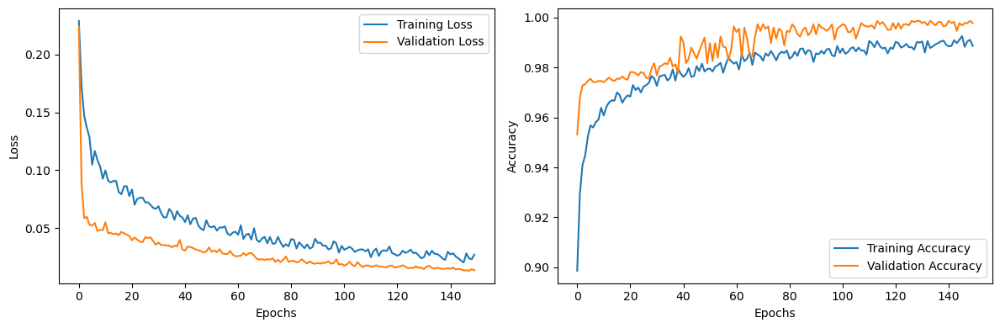

In [52]:
plt.figure(figsize=(12, 4))

# Plotting loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plotting accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [53]:
import pandas as pd

# Load your new data from the CSV file
new_data = pd.read_csv('X_test.csv')

# Prompt the user to enter a Subject ID for prediction
selected_subject_id = float(input("Enter the Subject ID for prediction: "))

# Get the data for the selected Subject ID
selected_data = new_data[new_data['SubjectID'] == selected_subject_id]

# Check if the selected Subject ID exists
if selected_data.empty:
    print("Subject ID not found!")
else:
    # Make predictions for the selected Subject ID
    selected_prediction = model.predict(selected_data.drop('SubjectID', axis=1))

    # Calculate the overall confusion score based on the mean prediction
    overall_confusion_score = round(selected_prediction.mean())
    
    print(f"Subject ID: {selected_subject_id}, Predicted Confusion Score: {overall_confusion_score}")


Enter the Subject ID for prediction:  4.0


21/21 [==============================] - 0s 4ms/step
Subject ID: 4.0, Predicted Confusion Score: 0


Training Model 1
Training Model 2
Training Model 3
Training Model 4
Training Model 5
72/72 [==============================] - 0s 2ms/step
Ensemble Accuracy: 0.9424934152765584


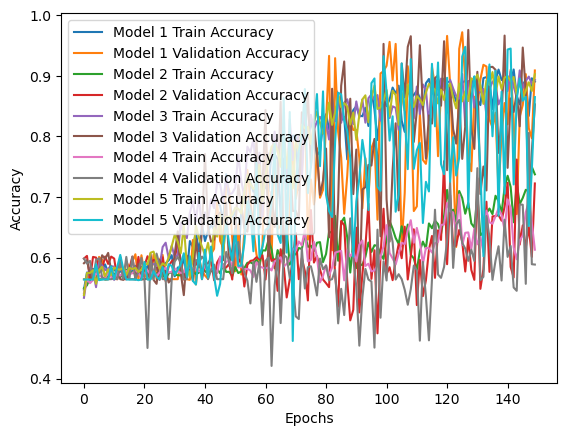

72/72 [==============================] - 0s 2ms/step


In [54]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adamax
import numpy as np
import matplotlib.pyplot as plt

# Splitting the data into train, validation, and test sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=42)

# Define and compile multiple neural networks with diverse architectures
num_models = 5
models = []
model_histories = []  # To store training histories for plotting
for i in range(num_models):
    model = Sequential()
    if i % 2 == 0:
        # Model with fewer layers
        model.add(Dense(64, input_shape=(3,), activation='relu'))
        model.add(BatchNormalization())
    else:
        # Model with more layers
        model.add(Dense(128, input_shape=(3,), activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.3))
        model.add(Dense(256, activation='relu'))
        model.add(BatchNormalization())
    model.add(Dense(1, activation='sigmoid'))
    
    optimizer = Adamax(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    models.append(model)

# Train each model using k-fold cross-validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for i, model in enumerate(models):
    print(f"Training Model {i+1}")
    history = model.fit(x_train, y_train, epochs=150, batch_size=28, validation_data=(x_val, y_val), verbose=0)
    model_histories.append(history)

# Make predictions with each model on the test set
predictions = np.zeros((len(x_test), num_models))
for i, model in enumerate(models):
    predictions[:, i] = model.predict(x_test).flatten()

# Evaluate each model on validation set and compute validation accuracy
val_accuracies = []
for i, model in enumerate(models):
    val_score = model.evaluate(x_val, y_val, verbose=0)[1]  # Get accuracy from evaluation
    val_accuracies.append(val_score)

# Calculate weights based on validation accuracy
weights = np.array(val_accuracies) / np.sum(val_accuracies)

# Ensemble by weighted averaging predictions
ensemble_predictions = np.dot(predictions, weights)

# Threshold ensemble predictions if it's for binary classification
threshold = 0.5
ensemble_predictions_binary = (ensemble_predictions > threshold).astype(int)

# Evaluate ensemble performance
ensemble_accuracy = accuracy_score(y_test, ensemble_predictions_binary)
print(f"Ensemble Accuracy: {ensemble_accuracy}")

# Generate and save confusion matrix and classification report for ensemble predictions
conf_matrix = confusion_matrix(y_test, ensemble_predictions_binary)
class_report = classification_report(y_test, ensemble_predictions_binary)

# Plot training and validation accuracy for each model
for i, history in enumerate(model_histories):
    plt.plot(history.history['accuracy'], label=f"Model {i+1} Train Accuracy")
    plt.plot(history.history['val_accuracy'], label=f"Model {i+1} Validation Accuracy")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Save the best model based on validation accuracy
best_model_index = np.argmax(val_accuracies)
best_model = models[best_model_index]
best_model.save('best_model.h5')

# Load the best model and make predictions
loaded_model = load_model('best_model.h5')
loaded_predictions = loaded_model.predict(x_test)


In [55]:
import pandas as pd
import numpy as np

# Load your new data from the CSV file
new_data = pd.read_csv('X_test.csv')

# Assuming your models expect columns in a certain order and without SubjectID column
# Reorder columns or drop unnecessary columns
# If 'SubjectID' column exists, set it as the index
if 'SubjectID' in new_data.columns:
    new_data.set_index('SubjectID', inplace=True)

# Convert new_data to a numpy array for prediction
new_data_array = new_data.to_numpy()

# Assuming you have 'models' as a list of trained models

# Make predictions with each model on the new data
new_predictions = []
for model in models:
    predictions = model.predict(new_data_array).flatten()
    new_predictions.append(predictions)

# Stack the predictions vertically to create the new_predictions array
new_predictions = np.vstack(new_predictions).T  # Transpose to match the shape for weighted averaging

# Calculate weights based on validation accuracy
# Assuming 'val_accuracies' contains the accuracy of each model calculated during training/validation
weights = np.array(val_accuracies) / np.sum(val_accuracies)

# Ensemble by weighted averaging predictions
ensemble_predictions = np.dot(new_predictions, weights)

# Threshold ensemble predictions if it's for binary classification
threshold = 0.5
ensemble_predictions_binary = (ensemble_predictions > threshold).astype(int)

# Prompt the user to enter a Subject ID for prediction
selected_subject_id = float(input("Enter the Subject ID for prediction: "))

# Get the index of the selected Subject ID in the new_data
subject_id_index = new_data.index.get_loc(selected_subject_id)

# Get the predicted confusion score for the selected Subject ID
selected_prediction = ensemble_predictions_binary[subject_id_index]

# Display the prediction
#print(f"Subject ID: {selected_subject_id}, Predicted Confusion Score: {selected_prediction}")
subject_id_index = new_data.index.get_loc(selected_subject_id)

# Get the predicted confusion scores for the selected Subject ID
selected_predictions = ensemble_predictions_binary[subject_id_index]

# Determine the most frequent prediction in the array
predicted_confusion_score = np.bincount(selected_predictions).argmax()

# Display the prediction
print(f"Subject ID: {selected_subject_id}, Predicted Confusion Score: {predicted_confusion_score}")



178/178 [==============================] - 1s 2ms/step


Enter the Subject ID for prediction:  2.0


Subject ID: 2.0, Predicted Confusion Score: 0
